# YOLOv8.1 License Plate Recognition

In [ ]:
!pip install easyocr

In [36]:
import csv
import cv2 as cv
from easyocr import Reader
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import os
from PIL import Image
import random
from sklearn.model_selection import train_test_split
import time
import uuid
import yaml

import mlflow
from mlflow.models.signature import ModelSignature
from mlflow.types.schema import ColSpec, Schema, TensorSpec

import torch
from ultralytics import YOLO, settings

## Dataset Preprocessing

In [3]:
raw_dir = "datasets/license_plates/"
allowed_formats = [".jpg", ".jpeg", ".png", ".txt"]

In [4]:
def file_paths(root, valid_formats):
    "get path to images/labels"
    file_paths = []

    # loop over the directory tree
    for dirpath, dirnames, filenames in os.walk(root):
        # loop over the filenames in the current directory
        for filename in filenames:
            # extract the file extension from the filename
            extension = os.path.splitext(filename)[1].lower()

            # if the filename has a valid extension we build the full 
            # path to the file and append it to our list
            if extension in valid_formats:
                file_path = os.path.join(dirpath, filename)
                file_paths.append(file_path)

    return file_paths

In [5]:
image_paths = file_paths(raw_dir + "images", allowed_formats[:3])
label_paths = file_paths(raw_dir + "labels", allowed_formats[-1])

In [6]:
print(len(image_paths), len(label_paths))

279 279


### Train/Test Split

In [7]:
# split the data into training, validation and testing sets
X_train, X_val_test, y_train, y_val_test = train_test_split(image_paths, label_paths, test_size=0.3, random_state=666)
X_val, X_test, y_val, y_test = train_test_split(X_val_test, y_val_test, test_size=0.7, random_state=666)

In [6]:
def write_files(images_path, labels_path, X):
    os.makedirs(images_path, exist_ok=True)
    os.makedirs(labels_path, exist_ok=True)

    for image_path in X:
        img_name = image_path.split("/")[-1].split(".")[0]
        img_ext = image_path.split("/")[-1].split(".")[-1]

        image = cv.imread(image_path)
        cv.imwrite(f"{images_path}/{img_name}.{img_ext}", image)

        f = open(f"{labels_path}/{img_name}.txt", "w")
        label_file = open(f"{raw_dir}/labels/{img_name}.txt", "r")
        f.write(label_file.read())
        f.close()
        label_file.close()

In [7]:
# create training dataset
write_files("datasets/images/train", "datasets/labels/train", X_train)
# create validation dataset
write_files("datasets/images/val", "datasets/labels/val", X_val)
# create test dataset
write_files("datasets/images/test", "datasets/labels/test", X_test)

### Prepare Training File

In [8]:
# get annotation classes
classes_file = open(raw_dir+'classes.txt', 'r')
lines = 0
names=[]

for line in classes_file:
    lines += 1
    names.append(line.strip())
 
classes_file.close()
print(names)

['licensen plate']


In [9]:
data = {
    "path": "../datasets",
    "train": "images/train",
    "val": "images/val",
    "test": "images/test",

    # Classes
    "names": names
}

# write the dictionary to a YAML file
with open("license_plates.yaml", "w") as f:
    yaml.dump(data, f)

### Verify Annotations

In [11]:
# pick 16 sample images by index
idxs = random.sample(range(0, random.randrange(len(X_train))), 16)

# get file paths
sample_images = []
# annotation_files = []

for idx in idxs:
    # get image + dimensions
    random_image = X_train[idx]
    img = cv.imread(random_image)
    dh, dw, _ = img.shape
    
    # get annotations
    annotation_file = 'datasets/license_plates/labels/'+X_train[idx].split("/")[-1].split(".")[0]+'.txt'
    sample_images.append({'img': random_image, 'dh': dh, 'dw': dw, 'annotation': annotation_file})

In [12]:
print(sample_images[0])

{'img': 'datasets/license_plates/images/7f8366d5-210.jpeg', 'dh': 450, 'dw': 624, 'annotation': 'datasets/license_plates/labels/7f8366d5-210.txt'}


In [13]:
# replace annotation file path with the list of annotation
annotated_images = []

for img in sample_images:
    count = 0
    annotations = []
    
    annotation_file = open(img['annotation'], 'r')
 
    for line in annotation_file:
        count += 1
        annotations.append(line.strip())
        # print(annotations)

    img['annotation'] = annotations
    annotated_images.append(img)
    annotation_file.close()

In [14]:
annotated_images[0]

{'img': 'datasets/license_plates/images/7f8366d5-210.jpeg',
 'dh': 450,
 'dw': 624,
 'annotation': ['0 0.576831644755754 0.43098670439090986 0.21400877547266192 0.12940414509314263']}

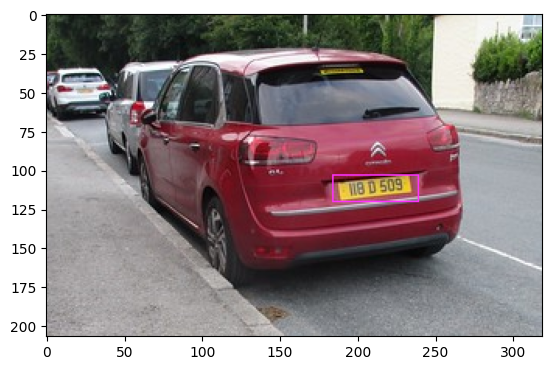

In [15]:
test234_bgr = cv.imread('datasets/license_plates/images/aa2b3501-31.jpg')
test234_rgb = cv.cvtColor(test234_bgr, cv.COLOR_BGR2RGB)
cv.rectangle(test234_rgb, (184, 103), (239, 120), (255, 51, 255), 1)
plt.imshow(test234_rgb)
plt.show()

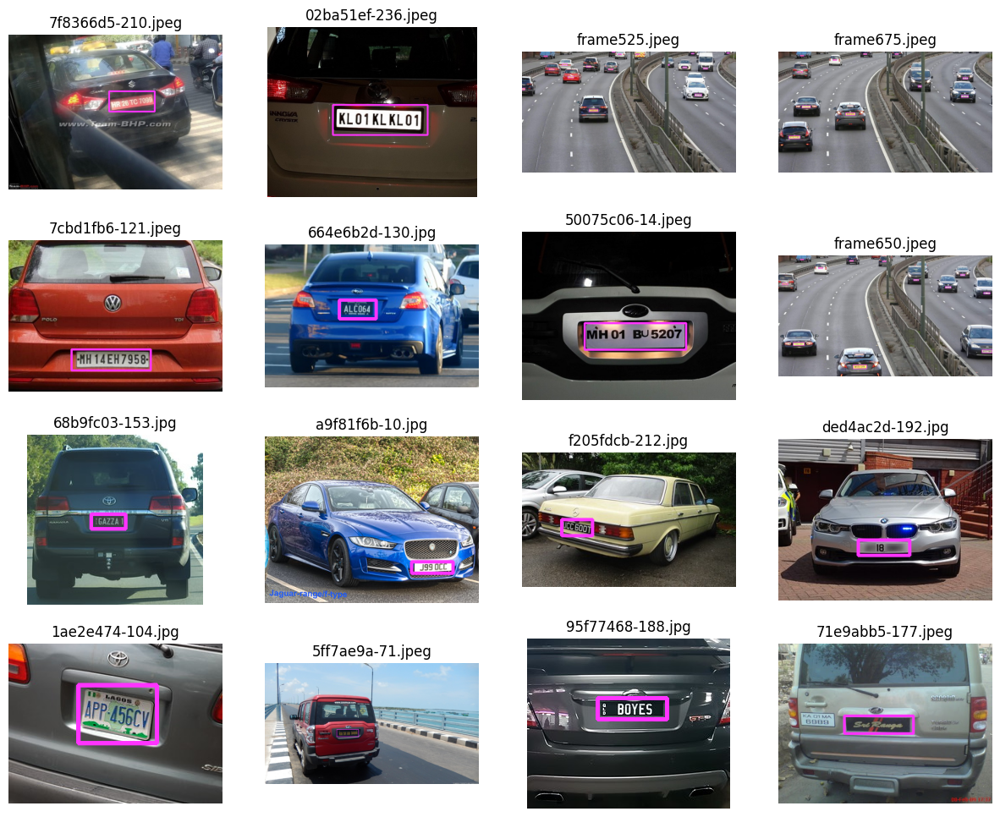

In [16]:
i = 0
plt.figure(figsize=(15,12))

for sample in annotated_images:

    img_path = sample['img']
    img_bgr = cv.imread(img_path)
    img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)
    dh = sample['dh']
    dw = sample['dw']
    annotations = sample['annotation']
    
    for annotation in annotations:
    
        # Split string to float
        _, x, y, w, h = map(float, annotation.split(' '))
        
        # https://stackoverflow.com/questions/44544471/how-to-get-the-coordinates-of-the-bounding-box-in-yolo-object-detection#comment102178409_44592380
        l = int((x - w / 2) * dw)
        r = int((x + w / 2) * dw)
        t = int((y - h / 2) * dh)
        b = int((y + h / 2) * dh)
        
        if l < 0:
            l = 0
        if r > dw - 1:
            r = dw - 1
        if t < 0:
            t = 0
        if b > dh - 1:
            b = dh - 1
        #print((l, t), (r, b), (0, 0, 255), 1)
        cv.rectangle(img_rgb, (l, t), (r, b), (255, 51, 255), 3)
        
    plt.subplot(4,4,i+1)
    plt.title(img_path.split("/")[-1])
    plt.axis('off')
    plt.imshow(img_rgb)

    i += 1    

plt.show()

## MLFlow

In [15]:
# start MLFlow
get_ipython().system_raw("mlflow ui --port 5000 --host 0.0.0.0 --backend-store-uri runs/mlflow &")

/opt/conda/lib/python3.10/site-packages/pydantic/_internal/_config.py:322: UserWarning: Valid config keys have changed in V2:
* 'schema_extra' has been renamed to 'json_schema_extra'
  warnings.warn(message, UserWarning)
[2024-03-02 10:14:49 +0000] [113] [INFO] Starting gunicorn 21.2.0
[2024-03-02 10:14:49 +0000] [113] [INFO] Listening at: http://0.0.0.0:5000 (113)
[2024-03-02 10:14:49 +0000] [113] [INFO] Using worker: sync
[2024-03-02 10:14:49 +0000] [114] [INFO] Booting worker with pid: 114
[2024-03-02 10:14:49 +0000] [115] [INFO] Booting worker with pid: 115
[2024-03-02 10:14:49 +0000] [116] [INFO] Booting worker with pid: 116
[2024-03-02 10:14:49 +0000] [117] [INFO] Booting worker with pid: 117


In [17]:
from ultralytics import settings

settings.update({
    'mlflow': True,
    'clearml': False,
    'comet': False,
    'dvc': False,
    'hub': False,
    'neptune': False,
    'raytune': False,
    'tensorboard': False,
    'wandb': False
})

## Model Training

In [20]:
# Load a model
EXPERIMENT = 'yolov8_lp_recognition'
WEIGHTS = 'yolov8s.pt'
DATASET = 'license_plates.yaml'
EPOCHS = 100

model = YOLO(WEIGHTS)  # load a pretrained model (recommended for training)

# Train the model
results = model.train(data=DATASET, project=EXPERIMENT, name=WEIGHTS[:-3] + '_' + DATASET[:-5] + '_' + str(EPOCHS), epochs=EPOCHS)

100%|██████████████████████████████████████████████████████████████████████████| 21.5M/21.5M [00:04<00:00, 4.61MB/s]


New https://pypi.org/project/ultralytics/8.1.20 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.19 🚀 Python-3.10.13 torch-2.2.1 CUDA:0 (NVIDIA GeForce GTX 1060 6GB, 6070MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=license_plates.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=yolov8_lp_recognition, name=yolov8s.pt, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, emb

train: Scanning /opt/app/notebooks/datasets/labels/train.cache... 195 images, 0 backgrounds, 0 corrupt: 100%|███████
val: Scanning /opt/app/notebooks/datasets/labels/val.cache... 25 images, 0 backgrounds, 0 corrupt: 100%|██████████| 


Plotting labels to yolov8_lp_recognition/yolov8s.pt/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)


2024/03/02 11:27:35 WARNING mlflow.utils.autologging_utils: You are using an unsupported version of sklearn. If you encounter errors during autologging, try upgrading / downgrading sklearn to a supported version, or try upgrading MLflow.
2024/03/02 11:27:35 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


MLflow: logging run_id(e9f4c390d78a4aa9bf81ced01383e044) to runs/mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs/mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to yolov8_lp_recognition/yolov8s.pt
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100       4.5G      1.583      7.306      1.501          7        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58        0.6      0.345      0.357      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      4.57G      1.323      1.851      1.072         11        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.538      0.431      0.445       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100       4.6G      1.344      1.267      1.083         17        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.705        0.5      0.526      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      4.58G      1.405      1.241       1.15         32        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.678        0.5      0.495      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      4.61G      1.309      1.023      1.142         15        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58       0.75      0.483      0.505      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100       4.6G      1.414       1.09      1.143          4        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.317      0.345      0.207     0.0871



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      4.58G      1.452      1.088      1.166         10        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.578      0.431      0.444      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100       4.6G       1.34      1.079      1.114          8        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.846        0.5      0.587       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      4.57G      1.286     0.9487      1.129          5        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.846      0.534      0.602      0.289



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100       4.6G      1.319     0.9103      1.149         14        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.534      0.414      0.361      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      4.59G      1.307     0.9018       1.09         35        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.721      0.431      0.519      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      4.59G      1.379      0.941      1.138         19        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58       0.89      0.556      0.657      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      4.58G      1.347     0.9021      1.121          5        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.861      0.483      0.599      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      4.59G      1.218     0.8433      1.099          7        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58       0.81      0.588      0.629      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      4.59G      1.214     0.8146      1.052         14        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.631       0.69      0.622      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      4.59G       1.26     0.8669      1.085         10        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.741      0.603       0.65      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      4.58G      1.221     0.8049      1.097         26        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58        0.9      0.534      0.666      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100       4.6G      1.205     0.8026      1.105         10        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.772      0.586      0.678      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      4.58G      1.194     0.7965      1.096         19        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.727      0.655      0.685      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      4.59G      1.247     0.8194      1.097          5        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58       0.92      0.672      0.741      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      4.57G       1.18     0.7565      1.065          7        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.871      0.603      0.707        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      4.59G      1.135     0.6903      1.034         34        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.799      0.672      0.726      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      4.58G      1.093     0.7035      1.055          4        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.855      0.586      0.709      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      4.58G      1.118     0.7145      1.065         10        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58       0.92      0.552      0.664      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      4.57G      1.231     0.7437      1.028         44        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.844      0.638       0.72      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      4.59G      1.108     0.7028      1.038          3        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.846      0.672      0.755      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100       4.6G      1.107     0.7411      1.031          7        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.871       0.69      0.762      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      4.58G      1.079     0.7118      1.015          6        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.867      0.707      0.758      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      4.58G      1.052     0.7036      1.007         22        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58       0.84      0.722      0.762      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100       4.6G      0.965     0.6294      1.007          5        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58       0.84      0.603      0.697      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100       4.6G      1.058     0.6789      1.033          9        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.882      0.741      0.798      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      4.58G      1.002     0.6548     0.9948         24        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.831      0.763      0.798      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      4.57G      1.005      0.642      1.009          5        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.838      0.713      0.784      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      4.58G      1.047     0.6549     0.9862         16        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.844       0.69      0.776      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      4.59G      1.001     0.6403      0.994          7        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58       0.91      0.776      0.817       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      4.61G      1.103     0.6573      1.011         15        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.939      0.638       0.77       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      4.58G      1.047     0.6166     0.9542         23        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58       0.93      0.689      0.764      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      4.59G      1.016     0.6025     0.9718         26        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.876       0.69      0.757       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100       4.6G      1.031     0.6339      1.016         12        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.965      0.759      0.836      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100       4.6G     0.9978     0.5883      1.001         10        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.937      0.765      0.849      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      4.57G     0.9913     0.5825     0.9888          6        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.977      0.721      0.845      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100       4.6G     0.9883       0.62     0.9971         31        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.865      0.741      0.817      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      4.58G     0.9336     0.6019     0.9667         17        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.937      0.767      0.858      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      4.58G      0.969     0.5845     0.9607         19        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.951      0.759      0.832      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      4.57G     0.9292     0.5465     0.9607         14        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.924      0.741      0.841      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100       4.6G     0.9176     0.5787     0.9628         21        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.883      0.724      0.817      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      4.58G     0.9232      0.564     0.9465         16        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.868      0.741      0.799      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      4.58G     0.9214     0.5546     0.9509         21        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.975      0.685      0.815       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      4.57G      0.907     0.5423     0.9779         23        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.955      0.736      0.829      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      4.59G     0.8549     0.5421     0.9534          7        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58       0.91      0.776       0.84      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      4.58G     0.8884     0.5189     0.9565         17        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.954      0.793      0.863      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      4.59G     0.9151     0.5344     0.9607         12        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.936      0.762      0.865      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      4.57G     0.9065      0.542     0.9619         17        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.949      0.724      0.854      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100       4.6G     0.8416     0.5162     0.9361          7        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58       0.97       0.81      0.891      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      4.59G     0.8675     0.5183     0.9418         15        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.876      0.734      0.806      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100       4.6G     0.8887     0.5161     0.9435         40        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.904      0.807      0.868      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      4.58G     0.8192     0.5098     0.9248         11        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.883      0.779      0.864      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      4.59G     0.8049      0.486     0.9218          6        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.899      0.767      0.842      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      4.58G     0.8007     0.4707     0.9282          9        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.919       0.81      0.857       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      4.59G     0.8522     0.5103     0.9342         15        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.881      0.793      0.832      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      4.58G      0.771     0.4699     0.9134         28        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.959      0.811      0.875      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      4.58G     0.7778     0.4702     0.9201          6        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.899       0.81       0.86      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      4.59G      0.783     0.4791      0.909          9        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.903        0.8      0.869      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      4.59G      0.839     0.4794     0.9109         42        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.917      0.776      0.857      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      4.58G     0.8134     0.4903      0.911         14        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58          1      0.758      0.865      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      4.59G     0.7786     0.4802     0.9123         14        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.918      0.759      0.863      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      4.59G     0.7997     0.4818     0.8999         30        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.995      0.828      0.891      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      4.59G     0.7936     0.4706     0.9145         27        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.979      0.823       0.89      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      4.58G       0.74     0.4526     0.9108          9        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.959      0.814      0.895      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      4.58G     0.7993     0.4619     0.9157         27        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.996      0.793       0.89      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100       4.6G     0.8171     0.5027     0.9375         12        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.953       0.81      0.886      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      4.58G     0.7572     0.4725     0.9249         19        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.979       0.81      0.884       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      4.57G     0.7577     0.4751     0.9094         20        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.973      0.828      0.888      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      4.59G     0.7772     0.4613     0.9152          6        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.959      0.804      0.894      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100       4.6G     0.7315     0.4526     0.9047         30        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.959       0.81      0.897       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100       4.6G     0.7492     0.4435     0.8964         19        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.979      0.821      0.901      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      4.57G      0.702     0.4441     0.9078         17        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.979      0.819      0.905      0.585



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      4.58G     0.6526      0.408     0.8903          7        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.941      0.822      0.898      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      4.58G     0.7338     0.4247     0.8758         12        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.953       0.81      0.904      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100       4.6G     0.6973     0.4188      0.871         18        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.971       0.81      0.899      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      4.58G     0.6871     0.4222     0.8824         10        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.976       0.81      0.888      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      4.59G     0.6763     0.4185     0.8824          7        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58          1      0.825      0.894      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100       4.6G     0.6665     0.4167     0.8775         20        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.979      0.811       0.89      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100       4.6G      0.657     0.4129     0.8895          4        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.979       0.82      0.887      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      4.58G      0.664     0.4115      0.894          6        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.972      0.828      0.887      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100       4.6G     0.7023     0.4349     0.8997         15        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.978      0.828      0.888        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      4.59G     0.6529     0.4123     0.8895          3        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.977      0.828      0.889      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      4.59G     0.6273      0.399     0.8794          7        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.972      0.776      0.881      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      4.58G     0.6554     0.3937     0.8772         21        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.959       0.81      0.885      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      4.58G     0.6746     0.3986     0.8803         18        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58       0.98      0.825      0.892      0.616


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      4.59G     0.6522     0.3724     0.8551         13        640: 100%|██████████| 13/13 [00:09<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.979        0.8       0.89       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      4.59G     0.5986     0.3544     0.8632          5        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58          1      0.806      0.891       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      4.57G     0.6038     0.3679     0.8496          3        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.993      0.828      0.895      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100       4.6G     0.5994     0.3654     0.8475         13        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.997      0.828      0.907      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      4.58G      0.606     0.3548     0.8424         17        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.972      0.828      0.904      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      4.58G     0.5432     0.3395     0.8265          3        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.992       0.81      0.901      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      4.57G     0.5595     0.3363     0.8434          3        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.975      0.828      0.901      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      4.59G     0.5763      0.353     0.8508          3        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.976      0.828      0.903      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100       4.6G     0.5977     0.3486     0.8695          9        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.979      0.817       0.89      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      4.59G     0.5629     0.3435     0.8474         14        640: 100%|██████████| 13/13 [00:08<00:00, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0

                   all         25         58      0.979      0.811      0.891       0.61



100 epochs completed in 0.276 hours.
Optimizer stripped from yolov8_lp_recognition/yolov8s.pt/weights/last.pt, 22.5MB
Optimizer stripped from yolov8_lp_recognition/yolov8s.pt/weights/best.pt, 22.5MB

Validating yolov8_lp_recognition/yolov8s.pt/weights/best.pt...
Ultralytics YOLOv8.1.19 🚀 Python-3.10.13 torch-2.2.1 CUDA:0 (NVIDIA GeForce GTX 1060 6GB, 6070MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:0


                   all         25         58      0.977      0.828      0.889      0.623
Speed: 0.2ms preprocess, 13.2ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to yolov8_lp_recognition/yolov8s.pt
MLflow: results logged to runs/mlflow
MLflow: disable with 'yolo settings mlflow=False'


![](./snapshots/mlflow_results_01.png)

## Model Eval

In [17]:
WEIGHTS = 'yolov8_lp_recognition/yolov8s.pt/weights/best.pt'
IMAGE = 'datasets/test/cars.jpg'
CONFIDENCE = 0.25
IOU = 0.45
COLOUR = (255, 51, 255)
FONT = cv.FONT_HERSHEY_SIMPLEX
FONTSCALE = 2
THICKNESS = 6

best_model = YOLO(WEIGHTS)

In [3]:
# Evaluate the model's performance on the validation set
results = best_model.val()

Ultralytics YOLOv8.1.19 🚀 Python-3.10.13 torch-2.2.1 CUDA:0 (NVIDIA GeForce GTX 1060 6GB, 6070MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs


val: Scanning /opt/app/notebooks/datasets/labels/val.cache... 25 images, 0 backgrounds, 0 corrupt: 100%|██████████| 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:0


                   all         25         58       0.98      0.827      0.889      0.618
Speed: 1.0ms preprocess, 13.5ms inference, 0.0ms loss, 17.7ms postprocess per image
Results saved to runs/detect/val3



image 1/1 /opt/app/notebooks/datasets/test/lamborghini-huracan-sterrato_2.jpg: 416x640 1 licensen plate, 74.8ms
Speed: 7.5ms preprocess, 74.8ms inference, 503.0ms postprocess per image at shape (1, 3, 416, 640)


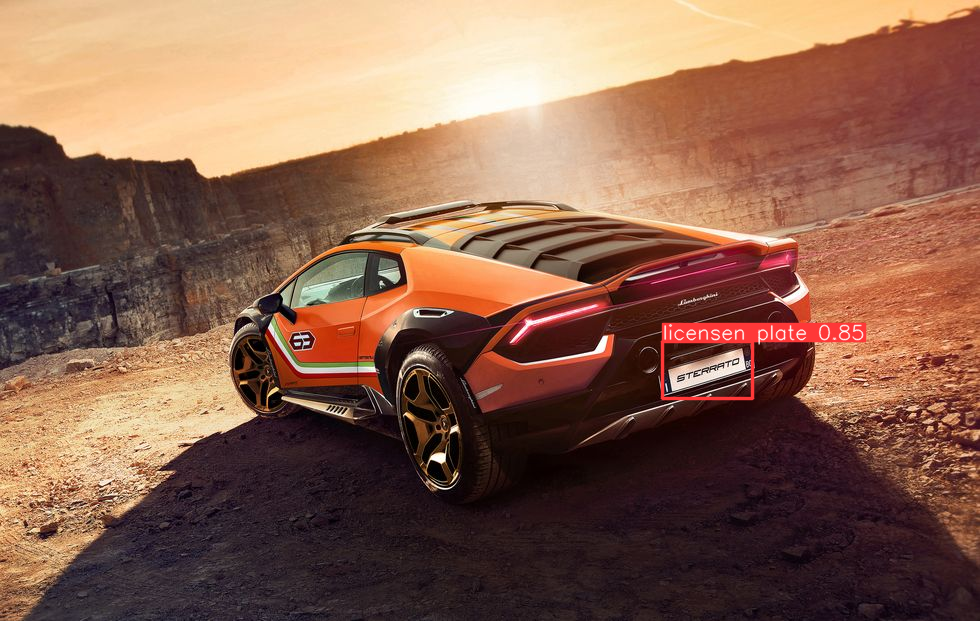

In [18]:
# Perform object detection on an image using the model
results = best_model('datasets/test/lamborghini-huracan-sterrato_2.jpg')

for r in results:
    im_array = r.plot()  # plot a BGR numpy array of predictions
    im = Image.fromarray(im_array[..., ::-1])  # RGB PIL image
    im.show()  # show image


image 1/1 /opt/app/notebooks/datasets/test/cars.jpg: 384x640 2 licensen plates, 119.4ms
Speed: 2.7ms preprocess, 119.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


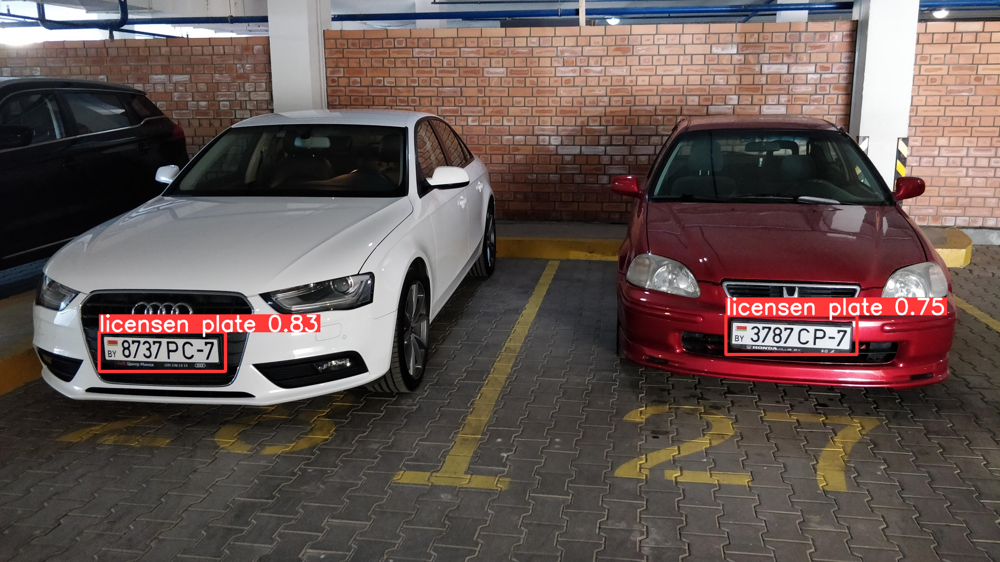

In [19]:
results = best_model.predict(
        source='datasets/test/cars.jpg',
        conf=CONFIDENCE,
        iou=IOU,
        show_labels=True,
        show_conf=True,
        imgsz=640,
    )

for r in results:
    im_array = r.plot()  # plot a BGR numpy array of predictions
    im = Image.fromarray(im_array[..., ::-1])  # RGB PIL image
    im.show()  # show image

In [20]:
def detect_number_plate(img, model, conf_threshold, iou_threshold, display=False):

    results = model.predict(
        source=img,
        conf=conf_threshold,
        iou=iou_threshold,
        show_labels=True,
        show_conf=True,
        imgsz=640,
    )

    for r in results:
        im_array = r.plot()
        image = Image.fromarray(im_array[..., ::-1])

    return image


image 1/1 /opt/app/notebooks/datasets/test/lamborghini-huracan-sterrato_1.jpg: 416x640 1 licensen plate, 16.5ms
Speed: 2.5ms preprocess, 16.5ms inference, 3.2ms postprocess per image at shape (1, 3, 416, 640)


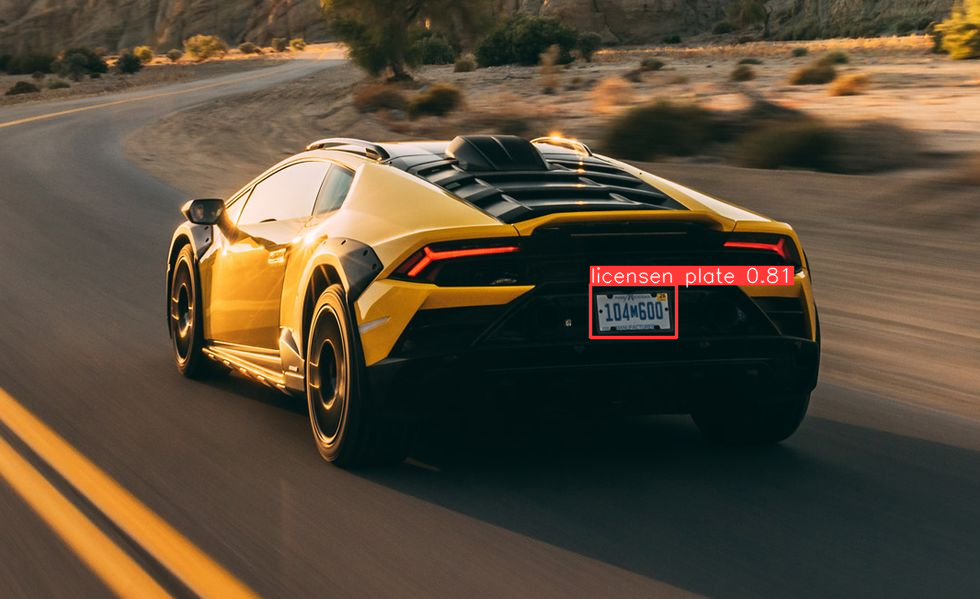

In [21]:
detect_number_plate('datasets/test/lamborghini-huracan-sterrato_1.jpg', best_model, CONFIDENCE, IOU)

In [5]:
get_ipython().system_raw("python serve_gradio.py &")
# http://localhost:7861/

Running on local URL:  http://0.0.0.0:7861

To create a public link, set `share=True` in `launch()`.

0: 416x640 1 licensen plate, 53.8ms
Speed: 3.0ms preprocess, 53.8ms inference, 258.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 licensen plate, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 448x640 (no detections), 58.3ms
Speed: 1.9ms preprocess, 58.3ms inference, 0.4ms postprocess per image at shape (1, 3, 448, 640)

0: 416x640 1 licensen plate, 13.1ms
Speed: 2.3ms preprocess, 13.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


![](./snapshots/gradio_eval_01.png)

## Run OCR

In [17]:
best_model = YOLO(WEIGHTS)

In [22]:
# trying to find out how to get bbox coords
def get_bboxes(img, model, conf_threshold, iou_threshold, display=False):
    start = time.time()

    results = model.predict(
        source=img,
        conf=conf_threshold,
        iou=iou_threshold,
        show_labels=True,
        show_conf=True,
        imgsz=640,
    )

    bbox = results[0].boxes.data
    # check if nothing was detected
    if bbox.shape != torch.Size([0, 6]):
        print(bbox)

In [23]:
get_bboxes(IMAGE, best_model, CONFIDENCE, IOU)
# tensor([[590.6743, 284.5848, 676.9486, 337.0631,   0.8114,   0.0000]], device='cuda:0')


image 1/1 /opt/app/notebooks/datasets/test/cars.jpg: 384x640 2 licensen plates, 17.8ms
Speed: 14.8ms preprocess, 17.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
tensor([[2.2895e+02, 7.6502e+02, 5.1979e+02, 8.5659e+02, 8.2725e-01, 0.0000e+00],
        [1.6723e+03, 7.2685e+02, 1.9748e+03, 8.1702e+02, 7.4674e-01, 0.0000e+00]], device='cuda:0')


In [24]:
# trying to extract bounding box coords
def get_bounding_boxes(img, model, conf_threshold, iou_threshold, display=False):
    start = time.time()

    results = model.predict(
        source=img,
        conf=conf_threshold,
        iou=iou_threshold,
        show_labels=True,
        show_conf=True,
        imgsz=640,
    )

    detections = results[0].boxes.data
    
    # check if nothing was detected
    if detections.shape != torch.Size([0, 6]):
        boxes = []
        confidences = []
        classes = []
        # if detection loop through and get bboxes
        for detection in detections:

            bbox = detection[:4]
            confidence = detection[4]
            type = int(detection[5])

            # ignore if below confidence threshold
            if float(confidence) < conf_threshold:
                continue

            # collect params
            boxes.append(bbox)
            confidences.append(confidence)
            classes.append(type)

    return boxes, confidences, classes

In [25]:
get_bounding_boxes(IMAGE, best_model, CONFIDENCE, IOU)
# ([tensor([590.6743, 284.5848, 676.9486, 337.0631], device='cuda:0')],
#  [tensor(0.8114, device='cuda:0')],
#  [0])


image 1/1 /opt/app/notebooks/datasets/test/cars.jpg: 384x640 2 licensen plates, 13.1ms
Speed: 3.5ms preprocess, 13.1ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


([tensor([228.9496, 765.0219, 519.7947, 856.5872], device='cuda:0'),
  tensor([1672.3274,  726.8477, 1974.7970,  817.0201], device='cuda:0')],
 [tensor(0.8272, device='cuda:0'), tensor(0.7467, device='cuda:0')],
 [0, 0])

In [26]:
# bounding box coords collected we now can use them to cut out the license plate
def draw_bounding_boxes(img_path, model, conf_threshold, iou_threshold, display=False):
    start = time.time()

    results = model.predict(
        source=img_path,
        conf=conf_threshold,
        iou=iou_threshold,
        show_labels=True,
        show_conf=True,
        imgsz=640,
    )

    detections = results[0].boxes.data
    
    # check if nothing was detected
    if detections.shape != torch.Size([0, 6]):
        boxes = []
        confidences = []
        classes = []
        # if detection loop through and get bboxes
        for detection in detections:

            bbox = detection[:4]
            confidence = detection[4]
            type = int(detection[5])

            # ignore if below confidence threshold
            if float(confidence) < conf_threshold:
                continue

            # collect params
            boxes.append(bbox)
            confidences.append(confidence)
            classes.append(type)

        # draw bbox over detected plate
        plate_boxes = []
        detections = []

        for i in range(len(boxes)):
            # separate x/y bbox coords
            xmin, ymin, xmax, ymax = int(boxes[i][0]), int(boxes[i][1]), int(boxes[i][2]), int(boxes[i][3])
            plate_boxes.append([[xmin, ymin, xmax, ymax]])
            
            img_rgb = mpimg.imread(img_path)
            image = cv.rectangle(img_rgb.astype(np.uint8), (int(xmin), int(ymin)), (int(xmax), int(ymax)), COLOUR, THICKNESS)
            text = "Score: {:.2f}%".format(confidences[i] * 100)
            image = cv.putText(image, text, (int(xmin), int(ymin) - 5), FONT,  
                   FONTSCALE, COLOUR, THICKNESS, cv.LINE_AA)
            
            # cut out plate
            plate = img_rgb[ymin:ymax, xmin:xmax]
            detections.append([image, plate])

        end = time.time()
        print("Detected plates: ", plate_boxes)
        print(f"Detection took: {(end - start)*1000:.0f}ms")

    return plate_boxes, detections


image 1/1 /opt/app/notebooks/datasets/test/cars.jpg: 384x640 2 licensen plates, 14.2ms
Speed: 2.7ms preprocess, 14.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Detected plates:  [[[228, 765, 519, 856]], [[1672, 726, 1974, 817]]]
Detection took: 345ms


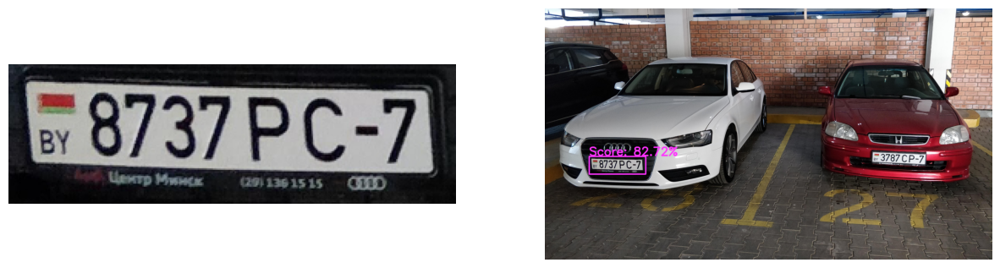

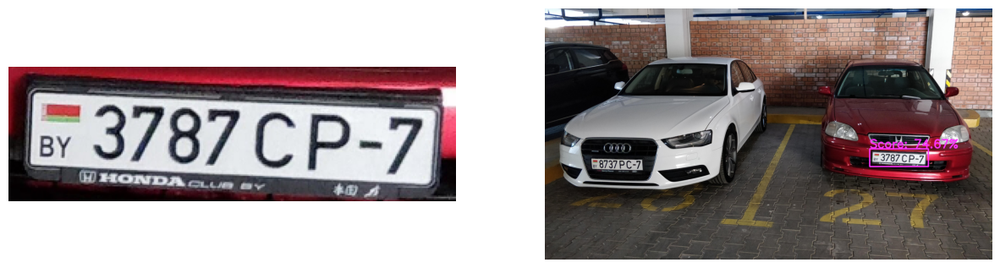

In [27]:
%matplotlib inline

plate_boxes, detections = draw_bounding_boxes(IMAGE, best_model, CONFIDENCE, IOU)

for detection in detections:
   plt.figure(figsize=(15,5))
   
   plt.subplot(1,2,2)
   plt.axis('off')
   plt.imshow(detection[0])
   
   plt.subplot(1,2,1)
   plt.axis('off')
   plt.imshow(detection[1])
   plt.show()

In [28]:
WEIGHTS = 'yolov8_lp_recognition/yolov8s.pt/weights/best.pt'
IMAGE = 'datasets/test/cars.jpg'
CONFIDENCE = 0.4
COLOUR = (255, 51, 255)
FONT = cv.FONT_HERSHEY_SIMPLEX
FONTSCALE = 0.75
THICKNESS = 2

In [29]:
def detect_plates(image, model):
    start = time.time()
    # run prediction
    detections = model.predict(image)[0].boxes.data

    # make sure predictions are not empty
    if detections.shape != torch.Size([0, 6]):
        
        boxes = []
        confidences = []

        # loop through detections
        for detection in detections:
            # pred example: [2.2895e+02, 7.6502e+02, 5.1979e+02, 8.5659e+02, 8.2725e-01, 0.0000e+00]
            # 0-3 = bbox coords, 4 = confidence, 5 = class
            confidence = detection[4]

            # skip if confidence is below threshold
            if float(confidence) < CONFIDENCE:
                continue

            # else record bbox coords + confidence
            boxes.append(detection[:4])
            confidences.append(detection[4])

        print(f"{len(boxes)} License plate(s) detected.")

        predictions = []
        images = []
        
        for i in range(len(boxes)):
            # extract bbox coords
            xmin, ymin, xmax, ymax = int(boxes[i][0]), int(boxes[i][1]), int(boxes[i][2]), int(boxes[i][3])
            # append to predictions
            predictions.append([[xmin, ymin, xmax, ymax], confidences[i]])
            print("INFO :: Detected regions", predictions)

            # draw predictions on original image
            bgr = cv.imread(IMAGE)
            rgb = cv.cvtColor(bgr, cv.COLOR_BGR2RGB)
            rgb_bbox = cv.rectangle(rgb, (xmin, ymin), (xmax, ymax), COLOUR, THICKNESS)
            text = "License: {:.2f}%".format(confidences[i] * 100)
            rgb_conf = cv.putText(rgb_bbox, text, (xmin, ymin - 5), FONT, FONTSCALE, COLOUR, THICKNESS)
            
            # crop plate region
            number_plate = rgb[ymin:ymax, xmin:xmax]

            images.append([rgb_conf, number_plate])


        end = time.time()
        print(f"Prediction took: {(end - start) * 1000:.0f} ms")
        
        return predictions, images

In [32]:
def ocr_plates(file_path, reader, predictions, write_to_csv=False):

    start = time.time()
    image = cv.imread(file_path)

    ocr_list = []
    
    for prediction in predictions:
        bbox = prediction[0]
        print(bbox)
        np_image = image[bbox[1]:bbox[3], bbox[0]:bbox[2]]

        # detect the text from the license plate using the EasyOCR reader
        ocr = reader.readtext(np_image, paragraph=True)

        if len(ocr) == 0:
            # if no text is detected, set the `text` variable to an empty string
            text = ""
        else:
            # set the `text` variable to the detected text
            text = str(ocr[0][1])

        # update the `predictions` list, adding the detected text
        ocr_list.append(text)

    if write_to_csv:
        # open the CSV file
        csv_file = open("number_plates.csv", "w")
        # create a writer object
        csv_writer = csv.writer(csv_file)
        # write the header
        csv_writer.writerow(["image_path", "box", "text"])

        # loop over the `predictions` list
        for box, text in predictions:
            # write the image path, bounding box coordinates,
            # and detected text to the CSV file
            csv_writer.writerow([image_or_path, box, text])
        # close the CSV file
        csv_file.close()

    end = time.time()
    # show the time it took to recognize the number plates
    print(f"OCR took: {(end - start) * 1000:.0f} ms")

    return ocr_list

In [39]:
# load best model weights
model = YOLO(WEIGHTS)
# initialize the EasyOCR reader
reader = Reader(['en'], gpu=True)

# path to an image or a video file
file_path = IMAGE
# get extensions to differentiate between images / videos
_, file_extension = os.path.splitext(file_path)

# Check extension
if file_extension in ['.jpg', '.jpeg', '.png']:
    print("INFO :: Image detection in progress")
    
    predictions, images = detect_plates(file_path, model)

    # if there are any number plates detected, recognize them
    if predictions != []:
        ocr_list = ocr_plates(file_path, reader, predictions, write_to_csv=False)
        
        # for box, confidence in predictions:
        #    cv.putText(image, confidence, (box[0], box[3] + 15), FONT, FONTSCALE, COLOUR, THICKNESS, cv.LINE_AA)
        
        for image in images:
            # save images and region cutouts
            id = uuid.uuid4()
            cv.imwrite(f'datasets/pred/{id}_image.jpg', cv.cvtColor(image[0], cv.COLOR_BGR2RGB))
            cv.imwrite(f'datasets/pred/{id}_cutout.jpg', cv.cvtColor(image[1], cv.COLOR_BGR2RGB))
            
            # open the CSV file
            csv_file = open(f'datasets/pred/{id}_plates.csv', 'w')
            # create a writer object
            csv_writer = csv.writer(csv_file)
            # write the header
            csv_writer.writerow(["image_path", "plate"])
    
            # loop over the `predictions` list
            for plate in ocr_list:
                # write the image path, bounding box coordinates,
                # and detected text to the CSV file
                csv_writer.writerow([file_path, plate])
            # close the CSV file
            csv_file.close()

INFO :: Image detection in progress

image 1/1 /opt/app/notebooks/datasets/test/cars.jpg: 384x640 2 licensen plates, 14.1ms
Speed: 3.0ms preprocess, 14.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)
2 License plate(s) detected.
INFO :: Detected regions [[[228, 765, 519, 856], tensor(0.8272, device='cuda:0')]]
INFO :: Detected regions [[[228, 765, 519, 856], tensor(0.8272, device='cuda:0')], [[1672, 726, 1974, 817], tensor(0.7467, device='cuda:0')]]
Prediction took: 416 ms
[228, 765, 519, 856]
[1672, 726, 1974, 817]
OCR took: 167 ms


In [38]:
# load best model weights
model = YOLO(WEIGHTS)
# initialize the EasyOCR reader
reader = Reader(['en'], gpu=True)

# path to an image or a video file
file_path = IMAGE
bgr = cv.imread(file_path)
rgb = cv.cvtColor(bgr, cv.COLOR_BGR2RGB)
# get extensions to differentiate between images / videos
_, file_extension = os.path.splitext(file_path)

# Check extension
if file_extension in ['.jpg', '.jpeg', '.png']:
    print("INFO :: Image detection in progress")
    
    predictions, images = detect_plates(file_path, model)

    lp = []
    
    for prediction in predictions:
        bbox = prediction[0]
        print(bbox)
        np_image = rgb[bbox[1]:bbox[3], bbox[0]:bbox[2]]

        # detect the text from the license plate using the EasyOCR reader
        ocr = reader.readtext(np_image, paragraph=True)

        if len(ocr) == 0:
            # if no text is detected, set the `text` variable to an empty string
            text = ""
        else:
            # set the `text` variable to the detected text
            text = str(ocr[0][1])

        # update the `predictions` list, adding the detected text
        lp.append(text)
        
        #plt.imshow(np_image)
print(lp)

INFO :: Image detection in progress

image 1/1 /opt/app/notebooks/datasets/test/cars.jpg: 384x640 2 licensen plates, 14.1ms
Speed: 2.7ms preprocess, 14.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)
2 License plate(s) detected.
INFO :: Detected regions [[[228, 765, 519, 856], tensor(0.8272, device='cuda:0')]]
INFO :: Detected regions [[[228, 765, 519, 856], tensor(0.8272, device='cuda:0')], [[1672, 726, 1974, 817], tensor(0.7467, device='cuda:0')]]
Prediction took: 481 ms
[228, 765, 519, 856]
[1672, 726, 1974, 817]
['BY 873PPCZ 09+1361515 QDD', 'BY 3787CP-7 mnonD']


In [16]:
get_ipython().system_raw("python serve_gradio_ocr.py &")
# http://localhost:7861/

Running on local URL:  http://0.0.0.0:7861

To create a public link, set `share=True` in `launch()`.

image 1/1 /tmp/gradio/67f942002dbad0995a6a4c1702a424d962a5860a/lamborghini-huracan-sterrato_2.jpeg: 416x640 1 licensen plate, 54.3ms
Speed: 2.6ms preprocess, 54.3ms inference, 291.3ms postprocess per image at shape (1, 3, 416, 640)


![](./snapshots/gradio_eval_02.png)